In [1]:
import tensorflow as tf
import numpy as np
import matplotlib as mpl
import IPython.display as display
from PIL import Image
import PIL
import os
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt


from utils.guided_deepdream_tiledgradients import ImprovedGuidedDeepDream

2025-05-21 17:13:42.621987: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-21 17:13:42.633855: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747840422.646672   57233 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747840422.650398   57233 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747840422.662231   57233 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:

print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("Devices available:", tf.config.list_physical_devices())

TensorFlow version: 2.19.0
Num GPUs Available:  1
Devices available: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


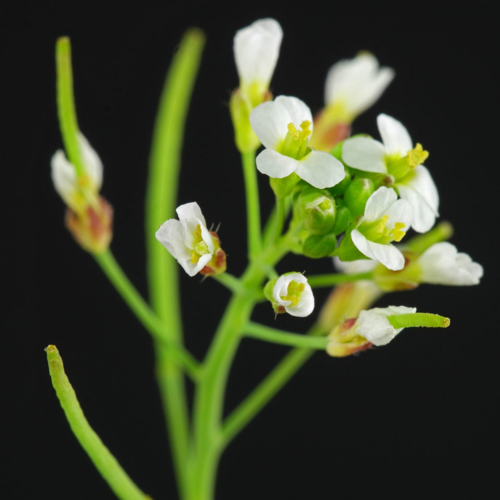

In [3]:
url = "https://pflanzenbestimmung.info/wp-content/uploads/2021/04/Arabidopsis-thaliana-4-1200x1200.jpg"

def download(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = tf.keras.utils.get_file(name, origin=url)
  img = PIL.Image.open(image_path)
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  return np.array(img)

# Normalize an image
def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

# Display an image
def show(img):
  display.display(PIL.Image.fromarray(np.array(img)))

# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)
show(original_img)

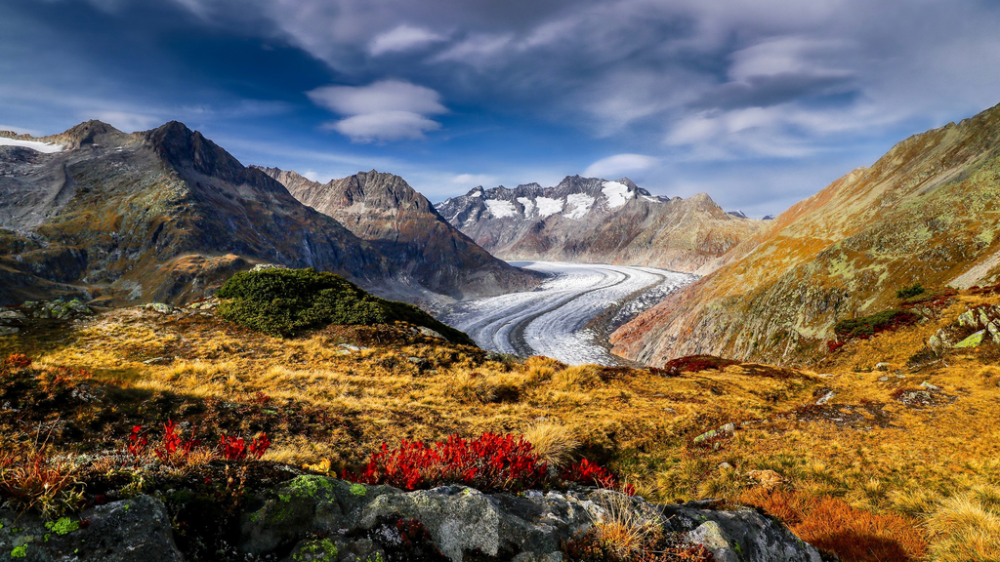

In [4]:
original_img = Image.open("pictures/mountains.jpg")

base_width = 1024
w_percent = base_width / float(original_img.size[0])
h_size = int((float(original_img.size[1]) * float(w_percent)))

resized_img = original_img.resize((base_width, h_size), Image.Resampling.LANCZOS)

resized_img.show()

original_img = resized_img
original_img.save('mountains_resized.jpg')


# Standard DeepDream

In [5]:
def calc_loss(img, model):
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return tf.reduce_sum(losses)

def random_roll(img, maxroll):
  shift = tf.random.uniform(shape=[2], minval=-maxroll, maxval=maxroll, dtype=tf.int32)
  img_rolled = tf.roll(img, shift=shift, axis=[0,1])
  return shift, img_rolled

class TiledGradients(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[2], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.int32),)
  )
  def __call__(self, img, img_size, tile_size=512):
    shift, img_rolled = random_roll(img, tile_size)

    gradients = tf.zeros_like(img_rolled)

    xs = tf.range(0, img_size[1], tile_size)[:-1]
    if not tf.cast(len(xs), bool):
      xs = tf.constant([0])
    ys = tf.range(0, img_size[0], tile_size)[:-1]
    if not tf.cast(len(ys), bool):
      ys = tf.constant([0])

    for x in xs:
      for y in ys:

        with tf.GradientTape() as tape:

          tape.watch(img_rolled)

          img_tile = img_rolled[y:y+tile_size, x:x+tile_size]
          loss = calc_loss(img_tile, self.model)

        gradients = gradients + tape.gradient(loss, img_rolled)

    gradients = tf.roll(gradients, shift=-shift, axis=[0,1])

    gradients /= tf.math.reduce_std(gradients) + 1e-8 

    return gradients
  

def run_deep_dream_with_octaves(img, model, steps_per_octave=100, step_size=0.01, 
                                octaves=range(-2,3), octave_scale=1.3, model_name=""):
  base_shape = tf.shape(img)
  img = tf.keras.utils.img_to_array(img)
  img = tf.keras.applications.inception_v3.preprocess_input(img)

  initial_shape = img.shape[:-1]
  img = tf.image.resize(img, initial_shape)
  

  get_tiled_gradients = TiledGradients(model)
  
  for octave in octaves:

    new_size = tf.cast(tf.convert_to_tensor(base_shape[:-1]), tf.float32)*(octave_scale**octave)
    new_size = tf.cast(new_size, tf.int32)
    img = tf.image.resize(img, new_size)

    for step in range(steps_per_octave):
      gradients = get_tiled_gradients(img, new_size)
      img = img + gradients*step_size
      img = tf.clip_by_value(img, -1, 1)

      if step % 10 == 0:
        display.clear_output(wait=True)
        show(deprocess(img))
        print(f"Model: {model_name}, Octave {octave}, Step {step}")

  result = deprocess(img)
  return result

## Imagenet Weights

In [6]:
names = ['mixed9_1', 'mixed10']

base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
standard_layers = [base_model.get_layer(name).output for name in names]
dream_model_standard = tf.keras.Model(inputs=base_model.input, outputs=standard_layers)

print("\nSetting up fine-tuned model...")
model_path ="models/flower_finetuned_inceptionv3_enhanced.h5"
fine_tuned_model = load_model(model_path)
fine_tuned_layers = [fine_tuned_model.get_layer(name).output for name in names]
dream_model_finetuned = tf.keras.Model(inputs=fine_tuned_model.input, outputs=fine_tuned_layers)



I0000 00:00:1747840425.574263   57233 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13512 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080, pci bus id: 0000:01:00.0, compute capability: 8.9



Setting up fine-tuned model...


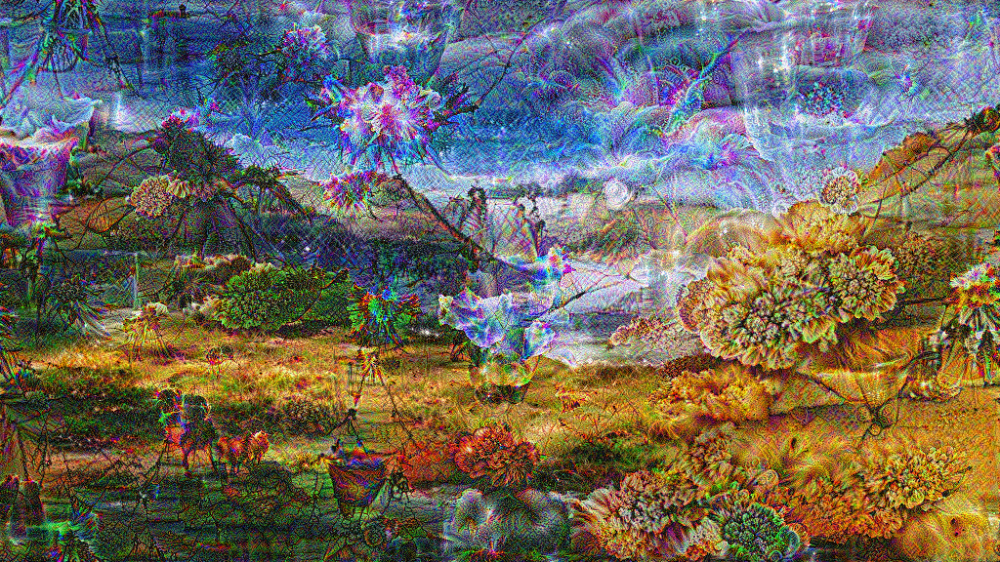

fine-tuned model result

Side-by-side comparison:


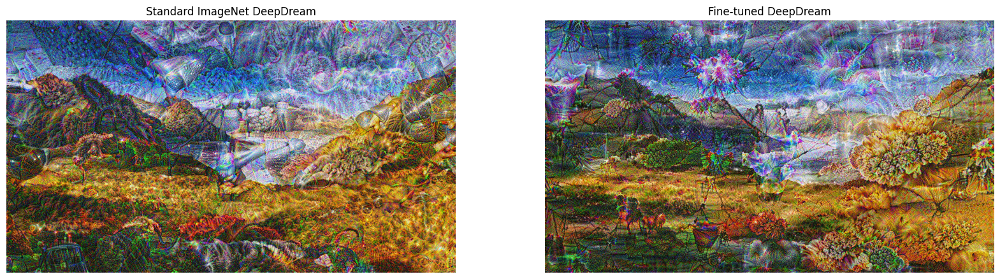

In [8]:

print("\nRunning DeepDream with standard ImageNet model...")
img_standard = run_deep_dream_with_octaves(
    img=original_img,
    model=dream_model_standard,
    steps_per_octave=500, 
    step_size=0.01,
    octave_scale=1.5,
    model_name="Standard ImageNet"
)


display.clear_output(wait=True)
img_standard = tf.image.resize(img_standard, tf.shape(original_img)[:-1], method=tf.image.ResizeMethod.LANCZOS3)
img_standard = tf.cast(tf.clip_by_value(img_standard, 0, 255), tf.uint8)
show(img_standard)
print("Standard ImageNet model result")
PIL.Image.fromarray(np.array(img_standard)).save('standard_model_dream.jpg')


print("\nRunning DeepDream with fine-tuned model...")
img_finetuned = run_deep_dream_with_octaves(
    img=original_img,
    model=dream_model_finetuned,
    steps_per_octave=500, 
    step_size=0.01,
    octave_scale=1.5,
    model_name="Fine-tuned"
)


display.clear_output(wait=True)
img_finetuned = tf.image.resize(img_finetuned, tf.shape(original_img)[:-1], method=tf.image.ResizeMethod.LANCZOS3)
img_finetuned = tf.cast(tf.clip_by_value(img_finetuned, 0, 255), tf.uint8)
show(img_finetuned)
print("fine-tuned model result")
PIL.Image.fromarray(np.array(img_finetuned)).save('finetuned_model_dream.jpg')


print("\nSide-by-side comparison:")
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(np.array(img_standard))
plt.title("Standard ImageNet DeepDream")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(np.array(img_finetuned))
plt.title("Fine-tuned DeepDream")
plt.axis('off')
plt.show()

# Enhance Features

## Optimizing octaves

Model initialized with layers: ['mixed8', 'mixed9']
Processing at size: (512, 299)


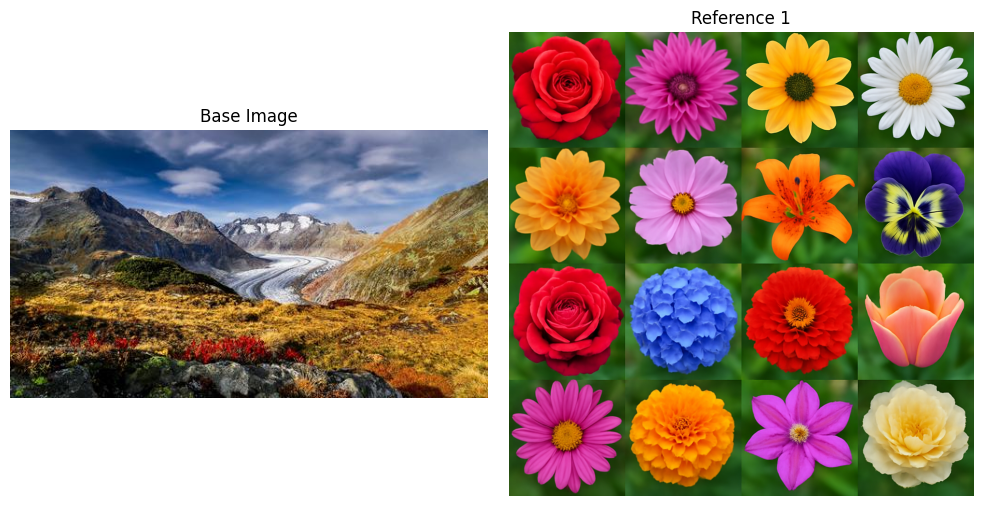

Starting guided dreaming with guidance weight: 0.7
Octaves: 5, Scale: 1.5, Iterations per octave: 300
Using 3 octaves based on image size
Processing octave 1/3 - Size: [132 227]
  Step 1/300 - Loss: 0.4114
  Step 6/300 - Loss: 0.6252
  Step 11/300 - Loss: 0.9380
  Step 16/300 - Loss: 1.0133
  Step 21/300 - Loss: 1.0169
  Step 26/300 - Loss: 1.0477
  Step 31/300 - Loss: 1.1545
  Step 36/300 - Loss: 1.1213
  Step 41/300 - Loss: 1.1555
  Step 46/300 - Loss: 1.1741
  Step 51/300 - Loss: 1.2090
  Step 56/300 - Loss: 1.2024
  Step 61/300 - Loss: 1.2485
  Step 66/300 - Loss: 1.2357
  Step 71/300 - Loss: 1.2183
  Step 76/300 - Loss: 1.2039
  Step 81/300 - Loss: 1.2289
  Step 86/300 - Loss: 1.2307
  Step 91/300 - Loss: 1.2406
  Step 96/300 - Loss: 1.2491
  Step 101/300 - Loss: 1.2598
  Step 106/300 - Loss: 1.3024
  Step 111/300 - Loss: 1.2450
  Step 116/300 - Loss: 1.2884
  Step 121/300 - Loss: 1.2888
  Step 126/300 - Loss: 1.3427
  Step 131/300 - Loss: 1.2771
  Step 136/300 - Loss: 1.3251
  St

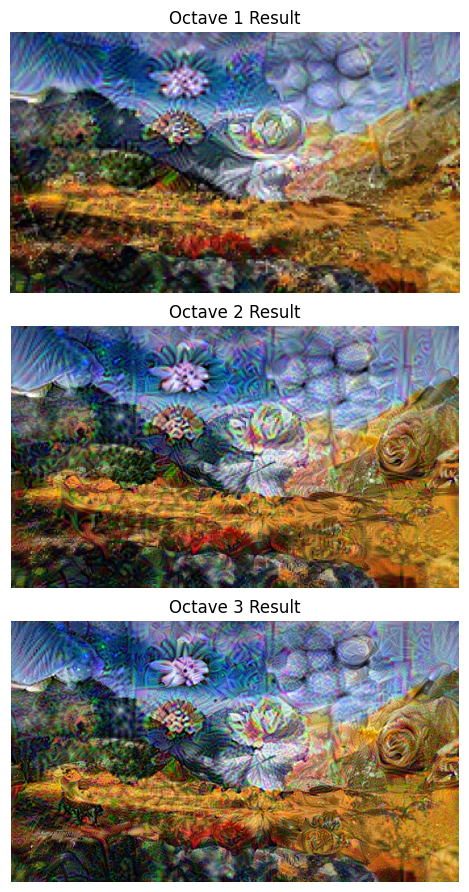

Resizing final result to original dimensions: (512, 288)


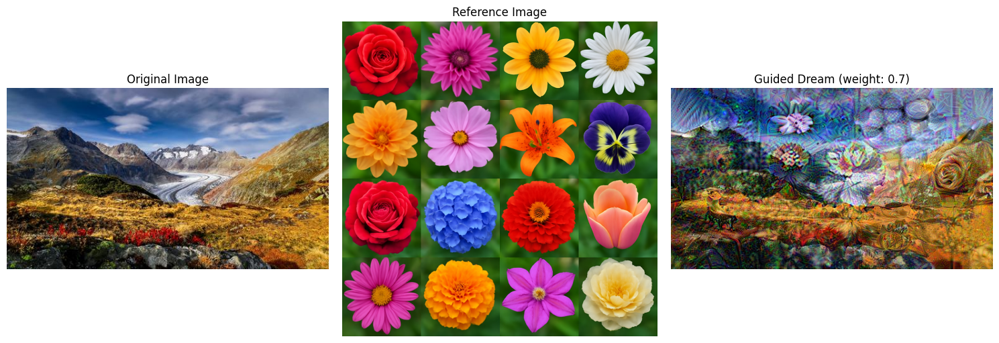

Result saved to improved_dream.jpg
Processing completed in 175.11 seconds


In [8]:
dreamer = ImprovedGuidedDeepDream(
    model_name='inception_v3',
    layers=['mixed8', 'mixed9']  
)

result = dreamer.guided_deepdream(
    base_img_path="pictures/mountains_resized.jpg",
    reference_img_paths=["dream_class_enhancer_images/flowers.png"],
    output_path='improved_dream.jpg',
    guidance_weight=0.7,        # Adjust guidance weight (0-1)
    octave_scale=1.5,           # Scale between octaves
    num_octaves=5,              # Number of octaves (scales) to process
    iterations_per_octave=300,   # More iterations = more detailed patterns
    step_size=0.01,             # Gradient step size
    jitter=32,                  # Random jitter to prevent artifacts
    display_results=True,       # Show result images
    show_progress=True,         # Show progress during processing
    high_quality=True           # Use higher quality processing
)


Model initialized with layers: ['mixed8', 'mixed9']
Processing at size: (512, 299)


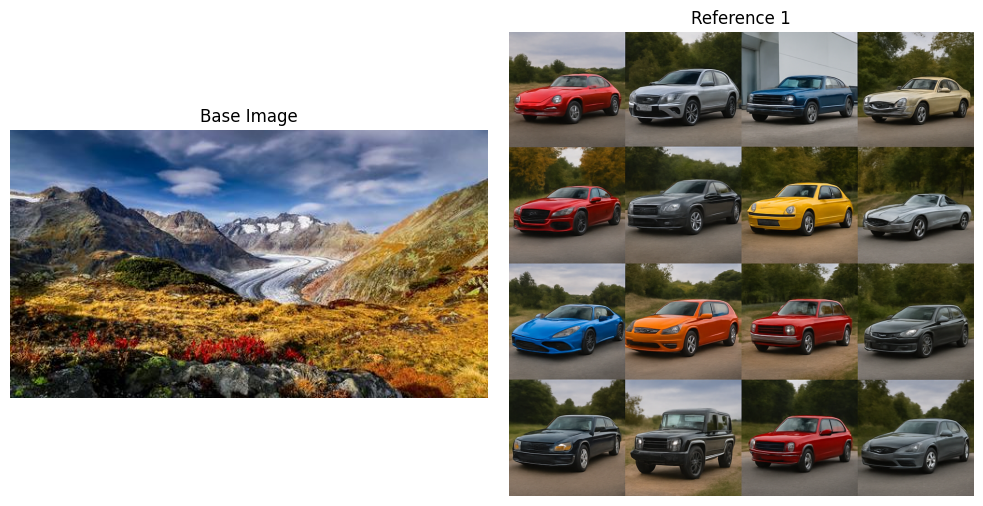

Starting guided dreaming with guidance weight: 1
Octaves: 5, Scale: 1.4, Iterations per octave: 500
Using 4 octaves based on image size
Processing octave 1/4 - Size: [108 186]
  Step 1/500 - Loss: 0.4794
  Step 6/500 - Loss: 0.6732
  Step 11/500 - Loss: 0.9995
  Step 16/500 - Loss: 1.0958
  Step 21/500 - Loss: 1.1971
  Step 26/500 - Loss: 1.3608
  Step 31/500 - Loss: 1.3976
  Step 36/500 - Loss: 1.4701
  Step 41/500 - Loss: 1.5901
  Step 46/500 - Loss: 1.5426
  Step 51/500 - Loss: 1.5485
  Step 56/500 - Loss: 1.6058
  Step 61/500 - Loss: 1.5658
  Step 66/500 - Loss: 1.5900
  Step 71/500 - Loss: 1.5892
  Step 76/500 - Loss: 1.5078
  Step 81/500 - Loss: 1.6272
  Step 86/500 - Loss: 1.5781
  Step 91/500 - Loss: 1.6220
  Step 96/500 - Loss: 1.6320
  Step 101/500 - Loss: 1.6274
  Step 106/500 - Loss: 1.6494
  Step 111/500 - Loss: 1.6646
  Step 116/500 - Loss: 1.6529
  Step 121/500 - Loss: 1.6597
  Step 126/500 - Loss: 1.6509
  Step 131/500 - Loss: 1.6546
  Step 136/500 - Loss: 1.6335
  Step

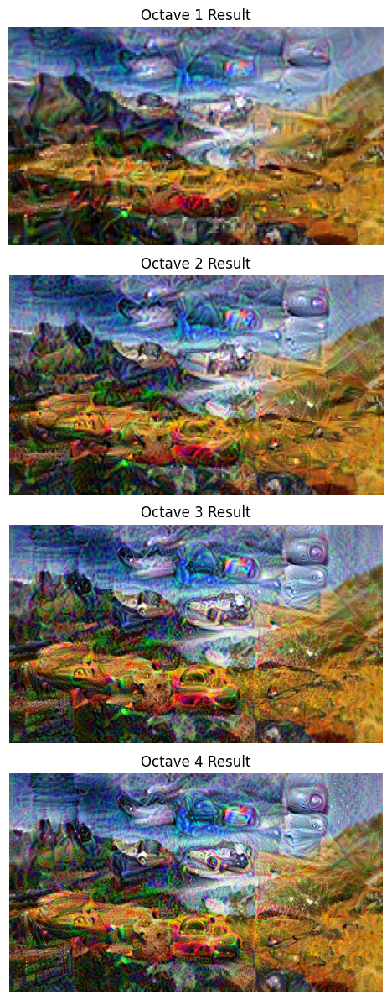

Resizing final result to original dimensions: (512, 288)


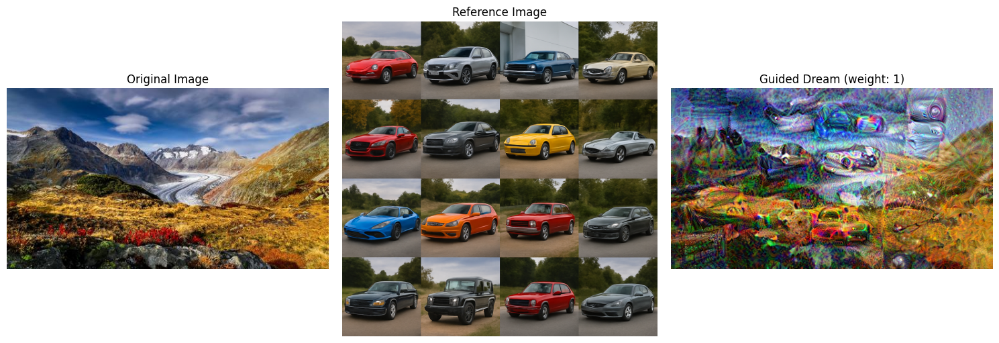

Result saved to car_dream.jpg
Processing completed in 364.53 seconds


In [10]:
dreamer = ImprovedGuidedDeepDream(
    model_name='inception_v3',
    layers=['mixed8', 'mixed9'] 
)


result = dreamer.guided_deepdream(
    base_img_path="pictures/mountains_resized.jpg",
    reference_img_paths=["dream_class_enhancer_images/cars9x9.png"],
    output_path='car_dream.jpg',
    guidance_weight=1,       
    octave_scale=1.4,          
    num_octaves=5,             
    iterations_per_octave=500,  
    step_size=0.01,            
    jitter=32,               
    display_results=True,      
    show_progress=True,         
    high_quality=True       
)